<a href="https://colab.research.google.com/github/catherman/gen-ai-blip/blob/main/blip_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Bootstrapping Language-Image Pretraining (BLIP):
# Leverages both text and image data to enhance AI models'
# understanding and generation of image descriptions.
# It bridges the gap between natural language and visual content,
# or NLP & Computer Vision.

import torch
import tensorflow as tf
import flax

# Install the transformers library
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
# Misc
import requests
import matplotlib.pyplot as plt

from google.colab import userdata
#userdata.get('secretName')
userdata.get('HF_TOKEN')

# Initialize the processor and model from Hugging Face
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [3]:
# Load an image. (Manually drag images from photo to file folders in colab at far left)
image = Image.open('/content/Yellowstone_Kids.png')

#  https://drive.google.com/drive/search?q=yellowstone

#  https://drive.google.com/file/d/1xqPLs-mNXfiptl6GKWRD33aqbXMU-uaX/view?usp=drive_link
# Prepare the image
inputs = processor(image, return_tensors="pt")

# Generate captions
outputs = model.generate(**inputs)
caption = processor.decode(outputs[0],skip_special_tokens=True)



/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


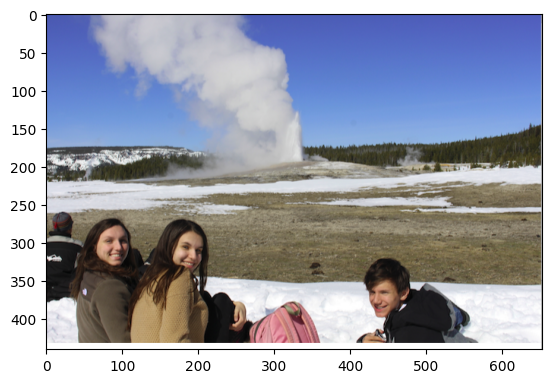

Generated Caption: a group of people sitting in the snow


In [4]:
#from PIL import Image
import matplotlib.pyplot as plt
plt.imshow(image)
plt.show() # image will not be displayed without this
print("Generated Caption:", caption)



In [5]:
# Visual Question Answering
# BLIP can also answer questions about the content of an image. Refer to the following code.

import requests
#from PIL import Image
#from transformers import BlipProcessor, BlipForConditionalGeneration
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large")


img_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/demo.jpg'
raw_image = Image.open(requests.get(img_url, stream=True, timeout=120).raw).convert('RGB')


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

a photograph of a woman sitting on the beach with a dog


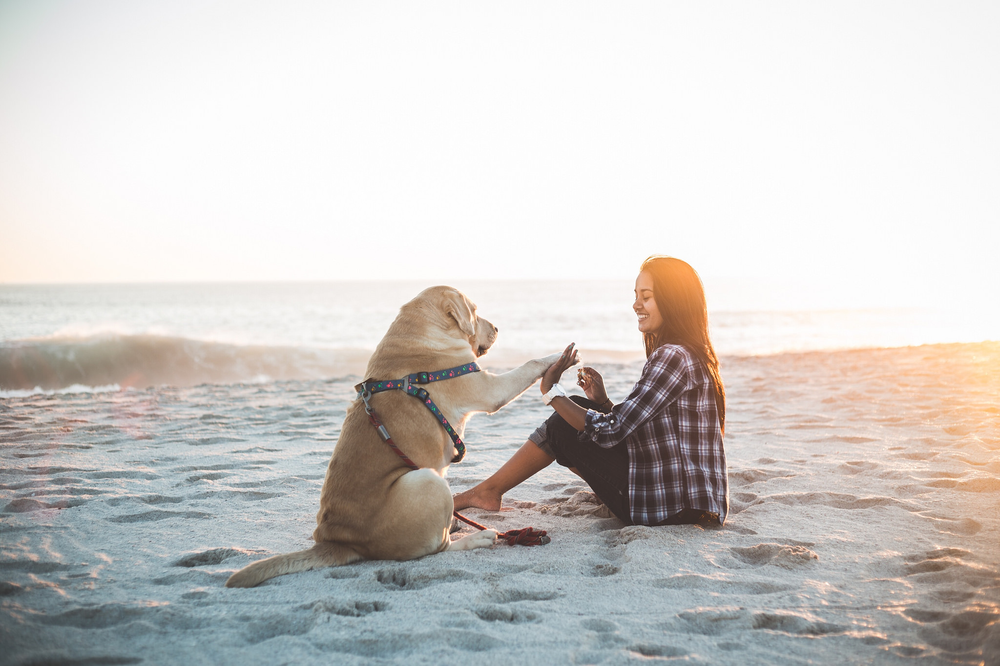

In [6]:
# conditional image captioning
text = "A photograph of"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image


In [7]:
# unconditional image captioning
inputs = processor(raw_image, return_tensors="pt")


out = model.generate(**inputs)
print(processor.decode(out[0], skip_special_tokens=True))



woman sitting on the beach with her dog and a cell phone


the weather in the picture is clear and sunny


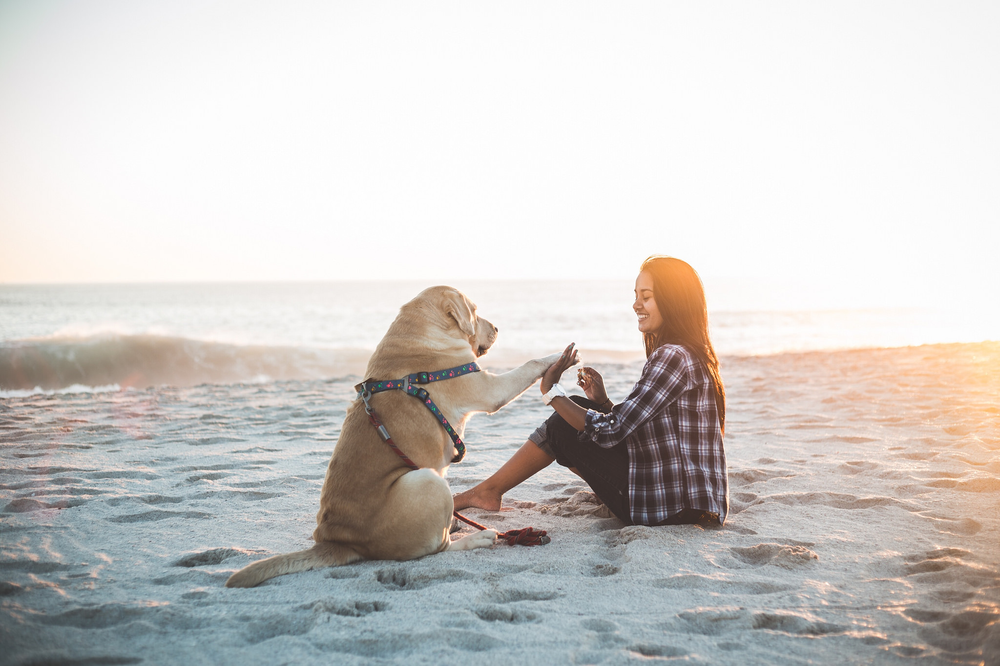

In [8]:
# conditional image captioning
text = "The weather in the picture is"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image

the mood of the women in the picture is very attractive


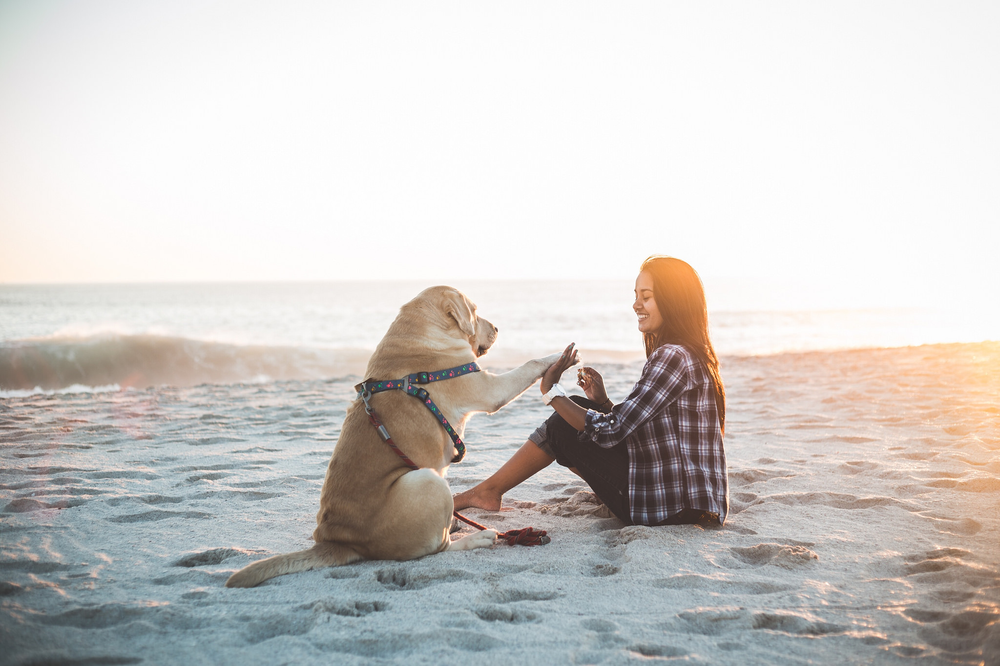

In [9]:
# conditional image captioning
text = "The mood of the women in the picture is"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image

the time of day in the picture is very good


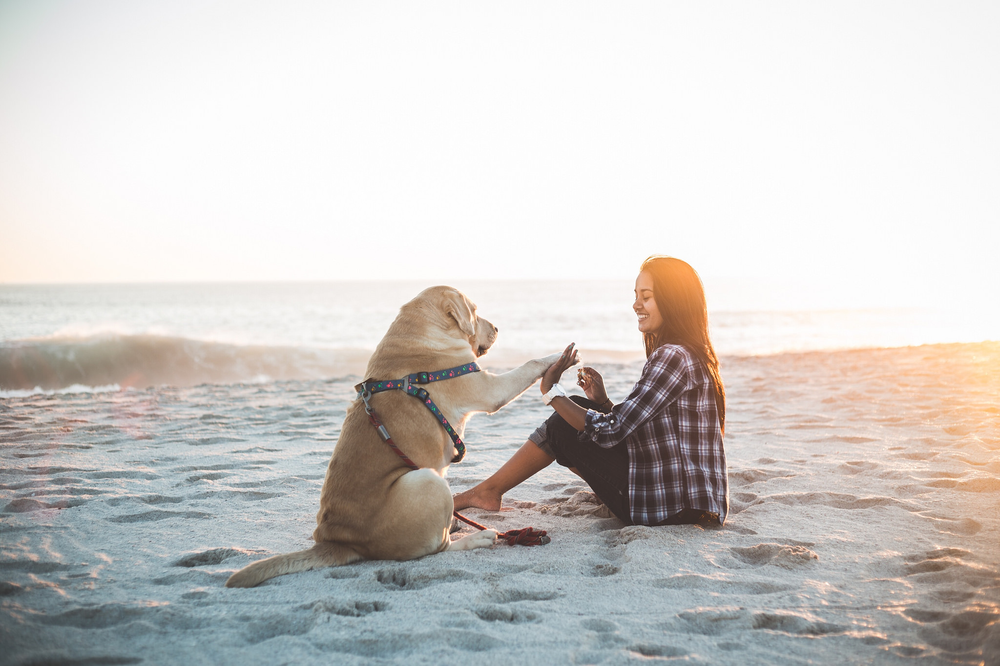

In [10]:
# conditional image captioning
text = "The time of day in the picture is"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image

the number of people in the picture is about to pet the dog


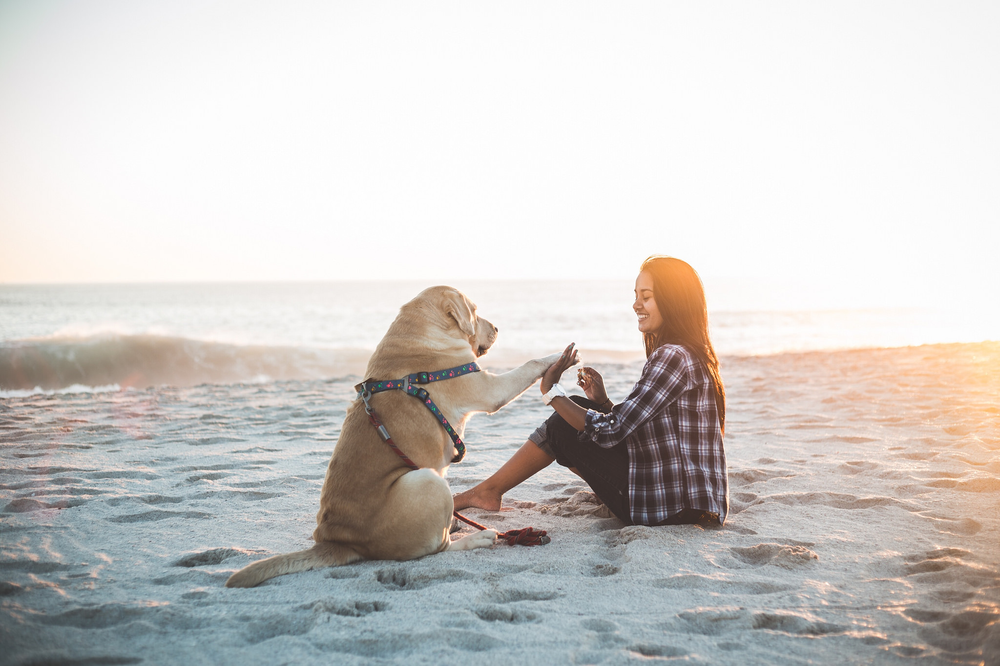

In [11]:
# conditional image captioning
text = "The number of people in the picture is"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image

the size of the dog in the picture is a woman and a dog


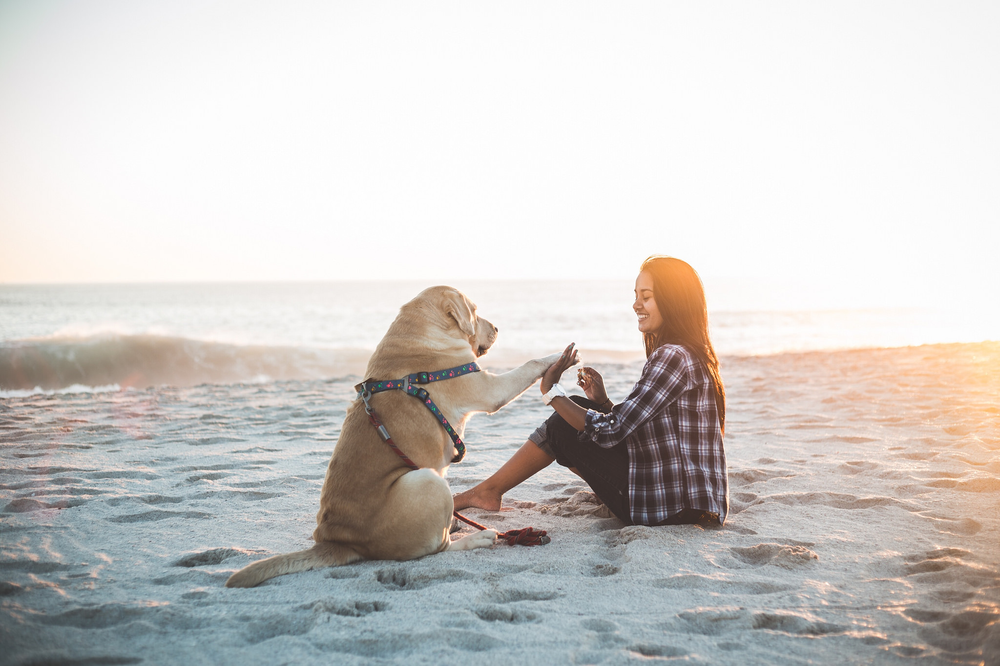

In [12]:
# conditional image captioning
text = "The size of the dog in the picture is"

inputs = processor(raw_image, text, return_tensors="pt")
out = model.generate(**inputs)

print(processor.decode(out[0], skip_special_tokens=True))
raw_image